<a href="https://colab.research.google.com/github/jailer2024/JAILER-CHAPID-SE-ALES-Y-SISTEMAS/blob/main/c_digos_parcial_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Parcial 2 de señales y sistemas

##Integrantes:
Jailer Chapid Romero

Paul Irua Rosero
             

#Solución primer punto:
Encuentre la expresión del espectro de Fourier (forma exponencial y trigonométrica) para la señal

$$ \tilde{x}(t) = |A \cos(2 \pi F_0 t)|^2, \quad t \in \left[ -\frac{1}{2 F_0}, \frac{1}{2 F_0} \right], \quad A, F_0 \in \mathbb{R}^+ $$

Realice las simulaciones respectivas para graficar el espectro de Fourier del ejercicio 1 (magnitud y fase como diagrama de Bode en decibelios), y presente el error relativo y la señal reconstruida para N = {1, 2,3 ... 50}

#1. Vamos a graficar la señal:
$$ |A \cos(2 \pi F_0 t)|^2, \quad t \in \left[ -\frac{1}{2 f_0}, \frac{1}{2 f_0} \right], \quad A, f_0 \in \mathbb{R}^+ $$
esta señal va a tener asignados unos parametros iniciales para $A = 5$ y $f_0 = 60$ hz para que así podamos mirar la gráfica de nuestra señal, pero si el usuario desea cambiar los valores de entrada asignados por defecto el sistema le pedirá que ingrese los nuevos valores.

Bienvenido señor usuario, en este programa vamos a mostrar la gráfica de la función x(t) mostrada en el ejercicio: 
señor usuario, ¿le gustaría modificar el valor de A y fo, o le gustaría visualizar los valores predeterminados? (si/no): no
muy bien, vamos a mostrar la gráfica con los valores de entrada predeterminados: 
wo= 376.9911184307752
Fo= 592.1762640653615


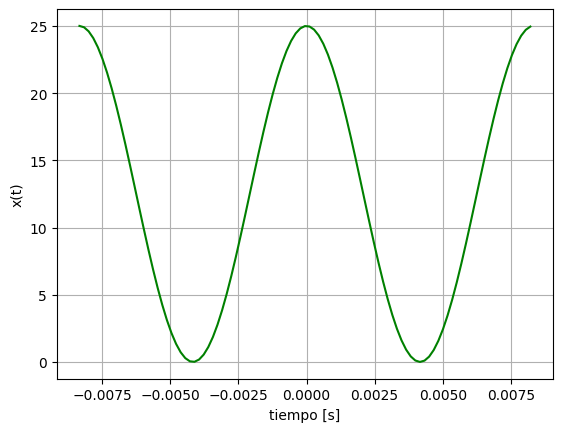

In [ ]:
#simulación de la señal x(t)
print('Bienvenido señor usuario, en este programa vamos a mostrar la gráfica de la función x(t) mostrada en el ejercicio: ') #mensaje de bienvenida al usuario

import numpy as np
import matplotlib.pyplot as plt #importamos libreria para graficos

%matplotlib inline

def pregunta_opcion():
  respuesta = input('señor usuario, ¿le gustaría modificar el valor de A y fo, o le gustaría visualizar los valores predeterminados? (si/no): ').lower()#pide respuesta y la transforma a minusculas
  if respuesta == 'si' or respuesta == 'no':
    return respuesta #si la respuesta es valida, el sistema la toma
  else:
    print('Error, solo se aceptan respuestas como si o no, por favor vuelva a correr el programa')#se muestra cuando se ha ingresado entrada diferente a si o a no

#llamamos a la función
opcion = pregunta_opcion()
if opcion == 'si':
  print('muy bien, vamos a realizar la acción solicitada: ')

  print('por favor ingrese el valor de A: ')
  A = float(input())
  print('por favor ingrese el valor de fo, (use expresiones numéricas, ej: 3.14 para pi):')
  try:
    fo = float(eval(input()))
  except (NameError, TypeError, SyntaxError):
    print("Entrada inválida. Por favor ingrese un valor numérico o una expresión numérica válida.")

  ti = (-1/(2*fo)) #tiempo inicial
  tf =  (1/(2*fo)) #tiempo final
  T = tf-ti #periodo de la señal
  wo = 2*np.pi/T #frecuencia angular
  Fo = wo/2*np.pi #frecuencia fundamental
  print('wo=',wo)
  print('Fo=',Fo)
  Fs = 10*Fo #frecuencia muestreo -> debe respetar Nyquist Fs >= 2 Fo
  tv = np.arange(ti,tf,1/Fs) #vector de tiempo
  Nm = len(tv) # Numero de muestras requeridas

  x = abs(A*np.cos((wo*tv)))**2 #señal de entrada
  plt.plot(tv,x, color ='green') #gráfica de la señal
  plt.xlabel('tiempo [s]')
  plt.ylabel('x(t)')
  plt.grid()
  plt.show()

elif opcion == 'no':
  print('muy bien, vamos a mostrar la gráfica con los valores de entrada predeterminados: ')
  A = 5
  fo = 60
  ti = (-1/(2*fo)) #tiempo inicial
  tf =  (1/(2*fo)) #tiempo final
  T = tf-ti #periodo de la señal
  wo = 2*np.pi/T #frecuencia angular
  Fo = wo/2*np.pi #frecuencia fundamental
  print('wo=',wo)
  print('Fo=',Fo)
  Fs = 10*Fo #frecuencia muestreo -> debe respetar Nyquist Fs >= 2 Fo
  tv = np.arange(ti,tf,1/Fs) #vector de tiempo
  Nm = len(tv) # Numero de muestras requeridas

  x = abs(A*np.cos((wo*tv)))**2 #señal de entrada
  plt.plot(tv,x, color ='green') #gráfica de la señal
  plt.xlabel('tiempo [s]')
  plt.ylabel('x(t)')
  plt.grid()
  plt.show()

#2. Bases

In [ ]:
#se crean las bases de la serie exponencial compleja de Fourier
T = tf - ti #intervalo de interés
N = 5 #número armonicos a simular
wo = 2*np.pi/T # frecuencia fundamental
# definir bases
phin = np.zeros((len(tv),2*N+1),dtype=np.complex_)#crear matriz para guardar bases
for n in range(-N,N+1,1):
    phin[:,n+N] = np.exp(1j*n*wo*tv)#base de fourier en el intervalo de interés

#3. Espectro

In [ ]:
#calcular espectro -> cambiar según la señal estudiada
cn = np.zeros(2*N+1,dtype=np.complex_)
nv = np.linspace(-N, N, 2*N+1) #vector armónicos
cn[N] = (A**2 / 2) # nivel dc C_0
cn[N-2] = (A**2 / 4) #armónico -2
cn[N+2] = (A**2 / 4) #armónico +2

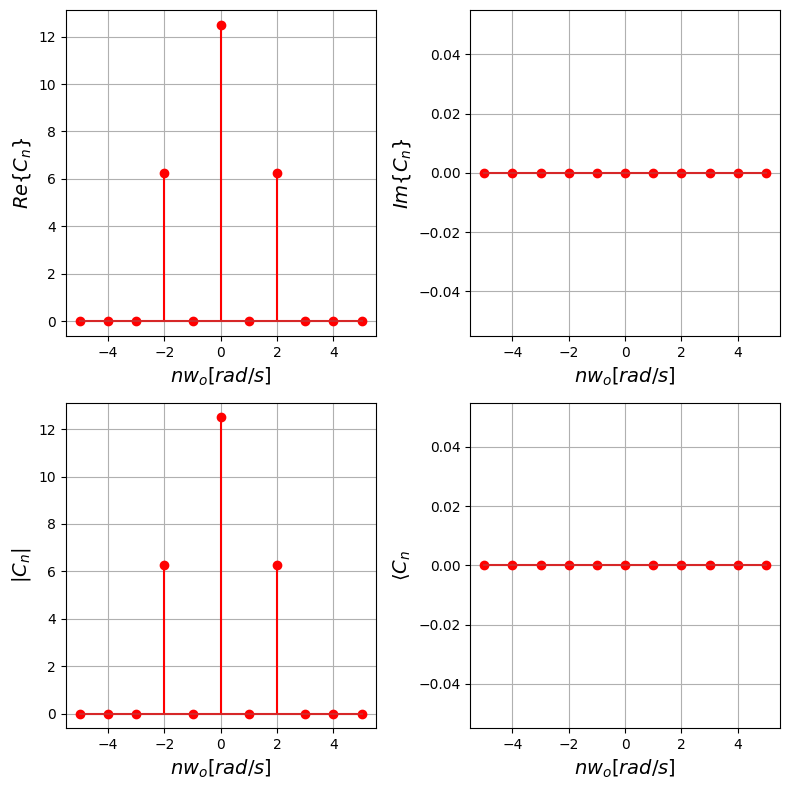

In [ ]:
#graficar espectro
fig = plt.figure(figsize=(8,8))
plt.subplot(2,2,1)
plt.stem(nv, np.real(cn), 'r')
plt.xlabel(r'$nw_o[rad/s]$',fontsize = 14)
plt.ylabel(r'$Re\{C_n\}$',fontsize = 14)
plt.axis('tight')
plt.grid()

plt.subplot(2,2,2)
plt.stem(nv, np.imag(cn), 'r')
plt.xlabel(r'$nw_o[rad/s]$',fontsize = 14)
plt.ylabel(r'$Im\{C_n\}$',fontsize = 14)
plt.axis('tight')
plt.grid()

plt.subplot(2,2,3)
plt.stem(nv, abs(cn), 'r')#magnitud del espectro
plt.xlabel(r'$nw_o[rad/s]$',fontsize = 14)
plt.ylabel(r'$|C_n|$',fontsize = 14)
plt.axis('tight')
plt.grid()

plt.subplot(2,2,4)
plt.stem(nv, np.angle(cn), 'r')#fase del espectro
plt.xlabel(r'$nw_o[rad/s]$',fontsize = 14)
plt.ylabel(r'$\langle C_n$',fontsize = 14)
plt.axis('tight')
plt.grid()

fig.tight_layout()

#4. Reconstrucción

/usr/local/lib/python3.11/dist-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/usr/local/lib/python3.11/dist-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


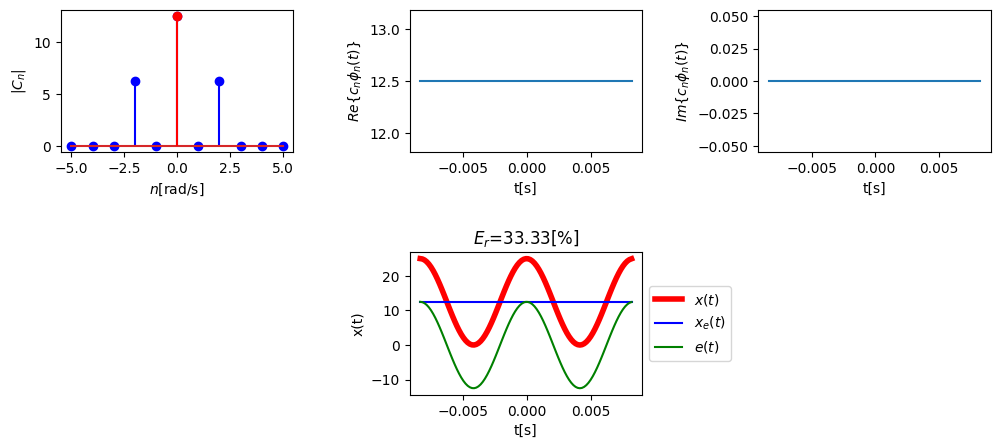

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [ ]:
from matplotlib import animation, rc
from IPython.display import HTML

#reconstrucción
Px = (3*A**4)/8
#figura y axes animaciónx
fig, ax = plt.subplots(2, 3,figsize=(12,5))
#función para gráfico interactivo
def update(n):
    #actualización regresor Bayesiano
    #Graficar prior
    ax[0,0].clear()
    ax[0,1].clear()
    ax[0,2].clear()
    ax[1,0].clear()
    ax[1,1].clear()
    ax[1,2].clear()

    #espectro
    ind = np.arange(N-n,N+n+1) #armónicos a considerar
    ax[0,0].stem(nv, abs(cn), 'b')#magnitud del espectro
    ax[0,0].stem(nv[ind], abs(cn[ind]), 'r')#magnitud del espectro
    ax[0,0].set_xlabel(r'$n$[rad/s]')
    ax[0,0].set_ylabel(r'$|C_n|$')

    #componentes espectrales
    ce = phin[:,ind].dot(np.diag(cn[ind]) )
    ax[0,1].plot(tv,np.real(ce))#componente real
    ax[0,1].set_xlabel('t[s]')
    ax[0,1].set_ylabel('$Re\{c_n\phi_n(t)\}$')

    ax[0,2].plot(tv,np.imag(ce))#componente imaginario
    ax[0,2].set_xlabel('t[s]')
    ax[0,2].set_ylabel('$Im\{c_n\phi_n(t)\}$')




    #reconstruccion
    er = 1- np.sum(abs(cn[ind])**2)/Px
    #señal reconstruida
    xe = phin[:,ind].dot(cn[ind] ) # dot calcula el producto entre vectores
    #error en t
    et = x - xe

    ax[1,1].plot(tv,x,'r',linewidth=4,label='$x(t)$')
    ax[1,1].plot(tv,xe,color='b',label='$x_e(t)$') # señal estimada o filtrada
    ax[1,1].plot(tv,et,color='g',label='$e(t)$') # señal estimada o filtrada
    ax[1,1].set_title('$E_r$=%.2f[%%]' % (100*er))
    ax[1,1].set_xlabel('t[s]')
    ax[1,1].set_ylabel('x(t)')
    ax[1,1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax[1,0].axis('off')
    ax[1,2].axis('off')
    plt.subplots_adjust(wspace=0.5,hspace=0.7)
    plt.show()

#desplegar animación
anim = animation.FuncAnimation(fig, update, frames=np.arange(0,N+1,1), blit=False)
rc('animation', html='jshtml')

anim

##Diagrama de bode

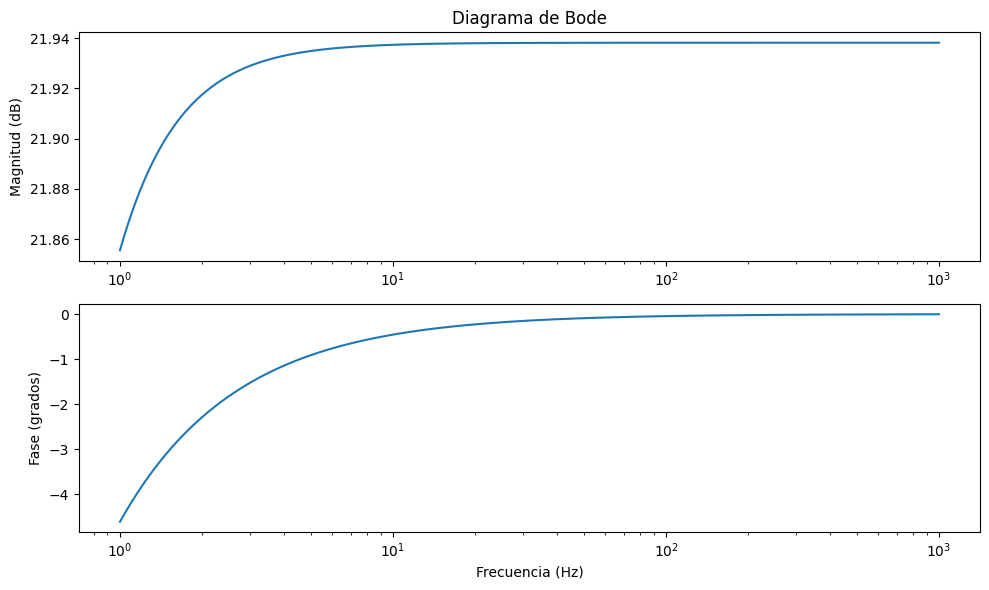

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

# Frecuencias de interés (en un rango alrededor de las frecuencias de interés)
frecuencias = np.logspace(0, 3, 1000)  # Rango logarítmico de frecuencias

# Función de transferencia para el espectro de Fourier de x(t)
# La señal tiene picos en f = 0 y f = +2, -2, así que usamos diracs en esas frecuencias
numerador = [A**2 / 2, A**2 / 4, A**2 / 4]  # Picos en 0, 2, -2
denominador = [1, 0, 0]  # Sistema no tiene un componente dinámico en sí

# Generamos la función de transferencia
system = signal.TransferFunction(numerador, denominador)

# Graficamos el diagrama de Bode
w, mag, phase = signal.bode(system, frecuencias * 2 * np.pi)  # Convertimos de Hz a radianes

# Graficar la magnitud y la fase
plt.figure(figsize=(10, 6))

# Magnitud
plt.subplot(2, 1, 1)
plt.semilogx(w / (2 * np.pi), mag)  # w convertido de radianes a Hz
plt.title('Diagrama de Bode')
plt.ylabel('Magnitud (dB)')

# Fase
plt.subplot(2, 1, 2)
plt.semilogx(w / (2 * np.pi), phase)
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Fase (grados)')

plt.tight_layout()
plt.show()


##Solución segundo punto

Sea la señal portadora c(t) = $A_c\sin(2πF_ct)$, con $A_c$ $F_c$ $∈ R$, y la señal mensaje $m(t)$ $∈ R$. Encuentre el espectro en frecuencia
 de la señal modulada en amplitud (AM), $y(t) = \left( 1 + \frac{m(t)}{A_{\text{c}}} \right) c(t)$. Luego, descargue desde youtube 5 segundos de su canción
 favorita (capturando del segundo 20 al 25). Presente una simulación de modulación por amplitud AM (tomando como mensaje el
 fragmento de la canción escogida). Grafique las señales en tiempo y frecuencia (magnitud y fase) de la señal mensaje, portadora
 y modulada. Reproduzca los fragmentos de audio del mensaje, portadora y señal modulada. Nota: se sugiere utilizar un canal de
 señal de audio para el desarrollo del ejercicio. El usuario debe poder escoger el índice de modulación deseado.


##Simulaciones

##descargar mp3 videos de youtube

In [ ]:
!pip install yt-dlp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.0/172.0 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 59.5 MB/s eta 0:00:00


##Link de la canción con nombre y salida

In [ ]:
name = ['The goodfather']
link = "https://www.youtube.com/watch?v=HWqKPWO5T4o"
!yt-dlp --extract-audio --audio-format mp3 -o "audio.%(ext)s" {link}

[youtube] Extracting URL: https://www.youtube.com/watch?v=HWqKPWO5T4o
[youtube] HWqKPWO5T4o: Downloading webpage
[youtube] HWqKPWO5T4o: Downloading tv client config
[youtube] HWqKPWO5T4o: Downloading player af7f576f
[youtube] HWqKPWO5T4o: Downloading tv player API JSON
[youtube] HWqKPWO5T4o: Downloading ios player API JSON
[youtube] HWqKPWO5T4o: Downloading m3u8 information
[info] HWqKPWO5T4o: Downloading 1 format(s): 251
[download] Destination: audio.webm
[download] 100% of    2.92MiB in 00:00:00 at 7.94MiB/s
[ExtractAudio] Destination: audio.mp3
Deleting original file audio.webm (pass -k to keep)


##Convertir mp3 a wav

In [ ]:
#convertir a .wav con ffmpeg para extraer audio en python
!ffmpeg -i audio.mp3 output.wav

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

##Leer wav en numpy

In [ ]:
!pip install soundfile

In [ ]:
import soundfile as sf # para instalar pip install soundfile
from IPython.display import Audio #librería para reproducir audio
#lee archivos wav

nombre_out = "output.wav"
x, fs = sf.read(nombre_out)

print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs,nombre_out))

Frecuencia de muestreo 48000.00[Hz]
audio output.wav


##Grafico en un intervalo de la señal de audio estereo(canal 1 y canal 2) en el dominio del tiempo

<ipython-input-12-c76701849233>:8: UserWarning: Legend does not support handles for str instances.
A proxy artist may be used instead.
See: https://matplotlib.org/stable/users/explain/axes/legend_guide.html#controlling-the-legend-entries
  plt.legend('canal 1', 'canal 2')
<ipython-input-12-c76701849233>:11: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


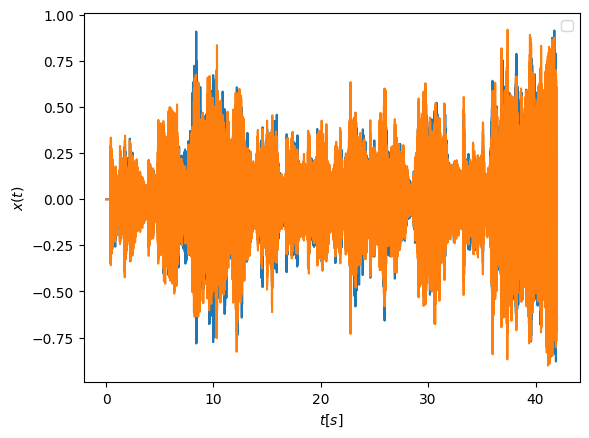

In [ ]:
xpro = x.copy() #copiar archivos para procesar
ti = 0 #tiempo incio a procesar seg
tf = 42 #tiempo final a procesar seg
xs = xpro[int(ti*fs):int((tf*fs)),:]

tt = np.arange(ti,tf,1/fs) # vector de tiempo
plt.plot(tt,xs)
plt.legend('canal 1', 'canal 2')
plt.xlabel('$t[s]$')
plt.ylabel('$x(t)$')
plt.legend()
plt.show()

In [ ]:
from IPython.display import Audio
ns = 42 #se reproducen los primeros ns segundos
Audio(x[:int(fs*ns),:].T,rate=fs)

##Se utiliza el canal 1 de la señal de audio

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


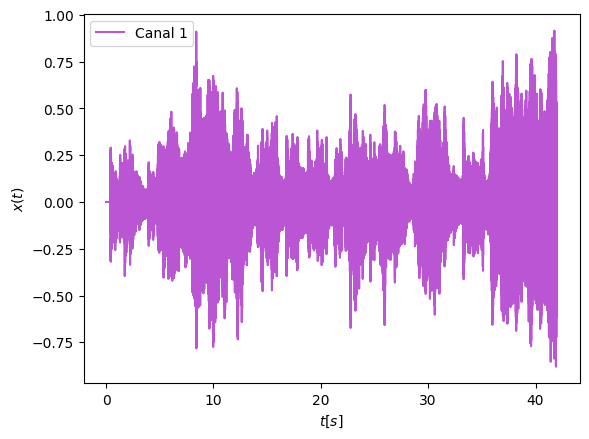

In [ ]:
xpro = x.copy()  # Copiar archivo para procesar
ti = 0  # Tiempo de inicio a procesar
tf = 42  # Tiempo final a procesar en segundos
xs = xpro[int(ti*fs):int(tf*fs), 0]  # Extraer solo el canal 1 (columna 0)

tt = np.arange(ti, tf, 1/fs)  # Crear el vector de tiempo
plt.plot(tt, xs, color='mediumorchid')  # Graficar solo el canal 1
plt.xlabel('$t[s]$')
plt.ylabel('$x(t)$')
plt.legend(['Canal 1'])  # Solo el canal 1
plt.show()


In [ ]:
#reproducción de un fragmento de la señal usando solo el canal 1 de audio
ns = 42  # Se reproducen los primeros ns segundos
# Seleccionar solo el canal 1 (primera columna) y reproducir
Audio(x[:int(fs*ns), 0], rate=fs)


##Espectro

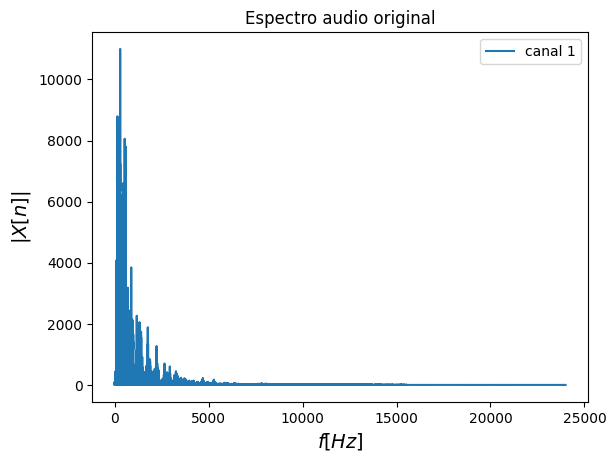

In [ ]:
Xw = np.fft.rfft(xs,axis=0) # axis=0 permite aplicar fft por cada columna de xpro
#Xwc1 = np.fft.rfft(xs[:,0])
#Xwc2 = np.fft.rfft(xs[:,1])
vf = np.fft.rfftfreq(np.size(xs,0),1/fs) #se crea el vector de frecuencias
plt.plot(vf,abs(Xw))#se grafica la magnitud
plt.legend(('canal 1','canal 2'))
plt.title(r'Espectro audio original')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.show()

In [ ]:
xpro = x.copy() #copiar archivos para procesar
#leer 5 segundos de la canción
ti = 20 #tiempo incio a procesar seg
tf = 25 #tiempo final a procesar seg
m = xpro[int(ti*fs):int((tf*fs)),0] #señal mensaje en primer canal

In [ ]:
#reproducir fragmento original #señal mensaje
Audio(m,rate=fs)

##Simulaciones

##señal portadora y señal mensaje

In [ ]:
mod = input('por favor señor usuario ingrese un indice de modulación deseado: ')
Im = float(mod) #índice de modulación
Fc = 15000 #frecuencia de portadora
ts = 5 #t segmento
t = np.arange(0,ts,1/fs) #vector del tiempo
Ac = np.max(abs(m))/Im #amplitud de la portadora según índice de modulación
c = Ac*np.sin(2*np.pi*Fc*t) #portadora

por favor señor usuario ingrese un indice de modulación deseado: 1


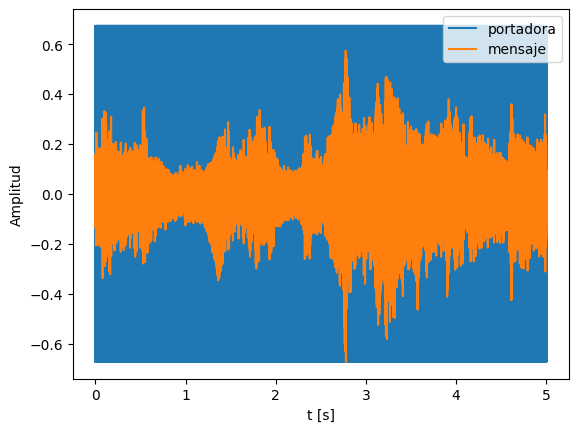

In [ ]:
#Grafica señal portadora y señal mensaje en el tiempo
plt.plot(t,c,label='portadora')
plt.plot(t,m,label='mensaje')
plt.xlabel('t [s]')
plt.ylabel('Amplitud')
plt.legend()
plt.show()

In [ ]:
#repoducir portadora
Audio(c,rate=fs)

##Señal modulada en amplitud

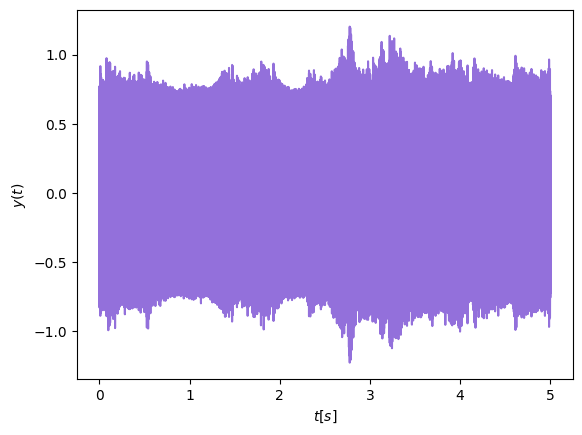

In [ ]:
y = (1+m/Ac)*c #señal modulada en AM
plt.plot(t,y, color='mediumpurple')
plt.xlabel('$t[s]$')
plt.ylabel('$y(t)$')
plt.show()

In [ ]:
Audio(y,rate=fs) #reproducir modulada

##Señales en el dominio de la frecuencia

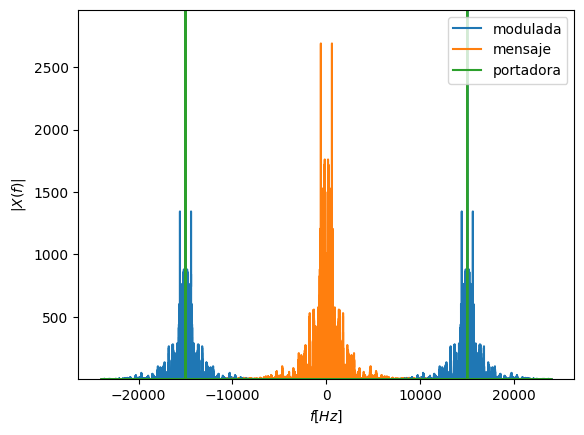

In [ ]:
#calculo de espectros
Xfc = np.fft.fft(c)
Xfm = np.fft.fft(m)
Xfy = np.fft.fft(y)

vfre = np.fft.fftfreq(len(c),1/fs)

plt.plot(vfre,abs(Xfy),label='modulada')
plt.plot(vfre,abs(Xfm),label='mensaje')
plt.plot(vfre,abs(Xfc),label='portadora')
plt.legend()
plt.xlabel('$f[Hz]$')
plt.ylabel('$|X(f)|$')
plt.ylim([np.min(abs(Xfm)), 1.1*np.max(abs(Xfm))])
plt.show()

##Solución tercer punto

Consulte en que consiste la distorsión total de armónicos (Total Harmonic Distortion-(THD)) y el factor de potencia en un circuito
electrico. Cómo puede calcularse el THD desde la FFT?. Cómo puede calcularse la distorsión del factor de potencia con base al THD?. Genere un ejemplo ilustrativo para el calculo del THD y la distorsión del factor de potencia para un rectificador de onda completa con carga: i) netamente resistiva y ii) carga RC en serie. Establezca las condiciones necesarias para las simulaciones. El
usuario podra escoger diferentes valores de R y C. Discuta los resultados obtenidos.

El Total Harmonic Distortion (THD) mide la distorsión en una señal, causada por la presencia de armónicos (frecuencias múltiples de la señal fundamental). En el caso de un rectificador de onda completa, los armónicos se generan por la no linealidad del proceso de rectificación.

La distorsión del factor de potencia se refiere a la desviación del factor de potencia de una carga ideal (resistiva pura) debido a los armónicos en la corriente. La distorsión se incrementa con la presencia de componentes reactivos (inductivos o capacitivos)

por favor ingrese un valor de resistencia: 45
por favor ingrese un valor de capacitancia(en microfaradios): 16
THD para carga resistiva: 325.2867
Factor de potencia para carga resistiva: 2.2222
THD para carga RC: 325.2867
Factor de potencia para carga RC: 0.0022


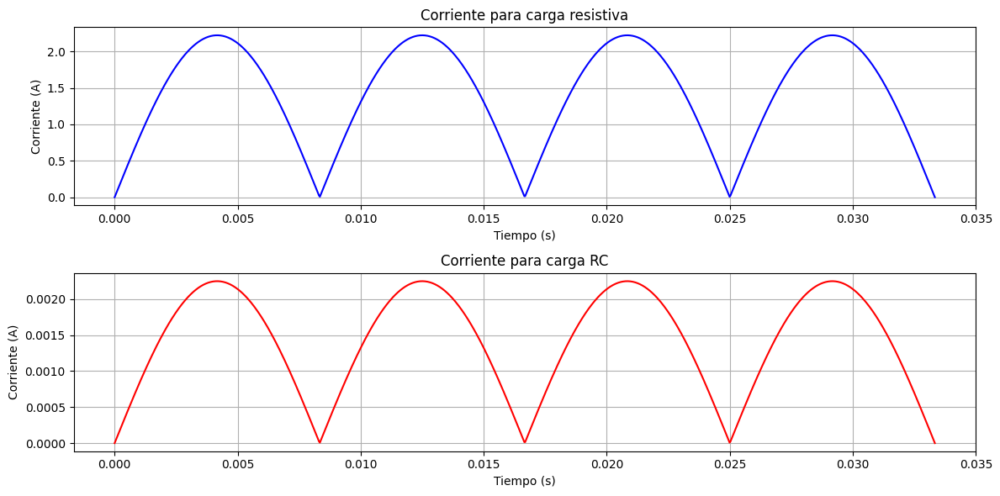

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq

# Parámetros de la simulación asignados por defecto
V_m = 100  # Valor máximo del voltaje de la fuente (V)
f = 60  # Frecuencia de la fuente (Hz)
T = 1 / f  # Periodo de la señal (s)
t = np.linspace(0, 2*T, 1000)  # Vector de tiempo, dos periodos para ver la forma de onda
R1=input('por favor ingrese un valor de resistencia: ')
C1=input('por favor ingrese un valor de capacitancia(en microfaradios): ')
R = float(R1)  # Resistencia (Ohm)
C = float(C1)**(-6)  # Capacitancia (Faradios)

# Carga resistiva
def corriente_resistiva(V_m, R, t):
    V_t = V_m * np.abs(np.sin(2 * np.pi * f * t))  # Rectificador de onda completa
    I_t = V_t / R  # Ley de Ohm
    return I_t

# Carga RC
def corriente_RC(V_m, R, C, t):
    V_t = V_m * np.abs(np.sin(2 * np.pi * f * t))  # Rectificador de onda completa
    X_C = 1 / (2 * np.pi * f * C)  # Reactancia capacitiva
    Z_RC = np.sqrt(R**2 + X_C**2)  # Impedancia total
    I_t = V_t / Z_RC  # Corriente en la carga RC
    return I_t

# Cálculo del THD
def calcular_thd(signal, t, f):
    N = len(t)
    freqs = fftfreq(N, t[1] - t[0])
    Y = fft(signal)
    # Filtramos las frecuencias no deseadas
    harmonics = [Y[i] for i in range(len(freqs)) if freqs[i] > 0 and freqs[i] <= f*10]  # Hasta el 10º armónico
    I_1 = np.abs(Y[1])  # Componente fundamental
    armónicos = np.array([np.abs(h) for h in harmonics[1:]])  # Armónicos (evitamos la fundamental)
    THD = np.sqrt(np.sum(armónicos**2)) / I_1  # Total Harmonic Distortion
    return THD

# Cálculo del Factor de Potencia Distorsionado
def calcular_fp(signal, t):
    # Estimación de la potencia activa (usando el promedio de la corriente multiplicado por el voltaje)
    potencia_media = np.mean(signal * np.abs(np.sin(2 * np.pi * f * t)))
    # Potencia aparente
    potencia_aparente = np.mean(np.abs(np.sin(2 * np.pi * f * t))**2)
    fp = potencia_media / potencia_aparente
    return fp

# Simulaciones para carga resistiva
corriente_res = corriente_resistiva(V_m, R, t)
thd_res = calcular_thd(corriente_res, t, f)
fp_res = calcular_fp(corriente_res, t)

# Simulaciones para carga RC
corriente_rc = corriente_RC(V_m, R, C, t)
thd_rc = calcular_thd(corriente_rc, t, f)
fp_rc = calcular_fp(corriente_rc, t)

# Resultados
print(f"THD para carga resistiva: {thd_res:.4f}")
print(f"Factor de potencia para carga resistiva: {fp_res:.4f}")
print(f"THD para carga RC: {thd_rc:.4f}")
print(f"Factor de potencia para carga RC: {fp_rc:.4f}")

# Graficando las señales
plt.figure(figsize=(12, 6))

# Graficar corriente para carga resistiva
plt.subplot(2, 1, 1)
plt.plot(t, corriente_res, label='Corriente carga resistiva', color='blue')
plt.title("Corriente para carga resistiva")
plt.xlabel("Tiempo (s)")
plt.ylabel("Corriente (A)")
plt.grid(True)

# Graficar corriente para carga RC
plt.subplot(2, 1, 2)
plt.plot(t, corriente_rc, label='Corriente carga RC', color='red')
plt.title("Corriente para carga RC")
plt.xlabel("Tiempo (s)")
plt.ylabel("Corriente (A)")
plt.grid(True)

plt.tight_layout()
plt.show()


##Solución cuarto punto
Desarrolle un sistema para identificar una palabra clave y autenticar al hablante utilizando herramientas basadas en la Transformada
de Fourier. El sistema debe presentarse como un Dashboard en Streamlit y cumplir con las siguientes condiciones: i) Permitir el
acceso unicamente si un miembro del grupo pronuncia la palabra clave. ii) Denegar el acceso en cualquier otro caso.
Ademas, se debe presentar y describir el esquema de solución que incluya: i) Diseño del sistema de detección. ii) La base de
datos creada para almacenar los patrones de voz y palabras clave. iii) Las consideraciones tecnicas para implementar la solución,
incluyendo el uso de la Transformada de Fourier para procesar las senales de voz.

**Instalación de librerías necesarias**

In [ ]:
!pip install matplotlib-venn
!apt-get -qq install -y libfluidsynth1

E: Package 'libfluidsynth1' has no installation candidate


Importamos la biblioteca libarchive (tanto en el sistema como en Python) para permitirte trabajar con archivos comprimidos y archivados

In [ ]:
!apt-get -qq install -y libarchive-dev && pip install -U libarchive
import libarchive

Selecting previously unselected package libarchive-dev:amd64.
(Reading database ... 124926 files and directories currently installed.)
Preparing to unpack .../libarchive-dev_3.6.0-1ubuntu1.3_amd64.deb ...
Unpacking libarchive-dev:amd64 (3.6.0-1ubuntu1.3) ...
Setting up libarchive-dev:amd64 (3.6.0-1ubuntu1.3) ...
Processing triggers for man-db (2.10.2-1) ...
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 7.4 MB/s eta 0:00:00
  Created wheel for libarchive: filename=libarchive-0.4.7-py3-none-any.whl size=31631 sha256=51b645f2f58800be73b410d35795142e5da58f8dd64aa323585c3da6ac0e118a
  Stored in directory: /root/.cache/pip/wheels/32/98/bd/4893d6923dd027f455b250367d402bfd69a6f4416581df46db
Successfully built libarchive


Instalamos Graphviz y pydot para poder crear y visualizar gráficos en Python. Graphviz se usa para la visualización, y pydot permite manejar esos gráficos desde Python.

In [ ]:
!apt-get -qq install -y graphviz && pip install pydot
import pydot

Instalamos la librería Cartopy para trabajar con mapas y visualizaciones geoespaciales en Python.

In [ ]:
!pip install cartopy
import cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 48.0 MB/s eta 0:00:00


##**Vamos a importar el audio de la palabra clave desde drive**
link de acceso: https://drive.google.com/file/d/1ULmbFz5jLR4-3KZnf2YbKbXuXN7c9Pb7/view?usp=drive_link

In [ ]:
# ID del archivo en Google Drive
FILEID="1ULmbFz5jLR4-3KZnf2YbKbXuXN7c9Pb7"
FILENAME="clave2.wav"  # Nombre del archivo de salida

# Descargar el archivo desde Google Drive y guardarlo como audioClaveSeñal.wav
!wget --no-check-certificate "https://docs.google.com/uc?export=download&id=$FILEID" -O $FILENAME

# Verificar si el archivo se descargó correctamente
!ls -lh $FILENAME

--2025-02-12 16:41:32--  https://docs.google.com/uc?export=download&id=1ULmbFz5jLR4-3KZnf2YbKbXuXN7c9Pb7
Resolving docs.google.com (docs.google.com)... 142.251.2.139, 142.251.2.100, 142.251.2.102, ...
Connecting to docs.google.com (docs.google.com)|142.251.2.139|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1ULmbFz5jLR4-3KZnf2YbKbXuXN7c9Pb7&export=download [following]
--2025-02-12 16:41:32--  https://drive.usercontent.google.com/download?id=1ULmbFz5jLR4-3KZnf2YbKbXuXN7c9Pb7&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 142.250.101.132, 2607:f8b0:4023:c06::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|142.250.101.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4876366 (4.7M) [audio/wav]
Saving to: ‘clave2.wav’

clave2.wav          100%[===================>]   4.65M  27.0MB/s    in 0.2s    

2025-02-1

**Gráfica de la señal de audio de la palabra clave**

Frecuencia de muestreo: 48000 Hz
Número de muestras: 2438144
Forma del audio: (2438144,)
Duración del audio: 50.79 segundos


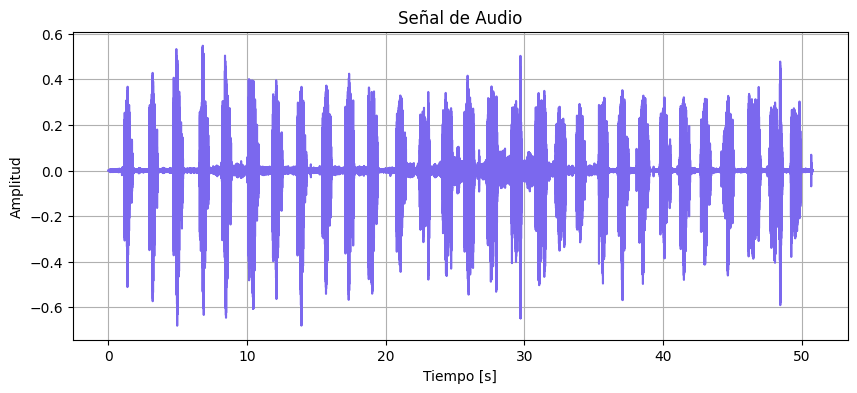

In [ ]:
import soundfile as sf  # Librería para leer archivos de audio

# Cargar el archivo de audio descargado
file_path = "clave2.wav"  # Ruta del archivo
audio_data, sample_rate = sf.read(file_path)

# Mostrar información básica del audio
print(f"Frecuencia de muestreo: {sample_rate} Hz")
print(f"Número de muestras: {len(audio_data)}")
print(f"Forma del audio: {audio_data.shape}")

# Si el audio tiene dos canales, convertirlo a mono
if len(audio_data.shape) == 2:
    audio_data = audio_data.mean(axis=1)  # Promediar los canales estéreo para obtener mono
    print("Audio convertido a mono.")

# Verificar duración del audio en segundos
duracion = len(audio_data) / sample_rate
print(f"Duración del audio: {duracion:.2f} segundos")

# Graficar la señal de audio
import matplotlib.pyplot as plt
import numpy as np

t = np.linspace(0, duracion, len(audio_data))  # Vector de tiempo
plt.figure(figsize=(10, 4))
plt.plot(t, audio_data, color="mediumslateblue")
plt.title("Señal de Audio")
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud")
plt.grid()
plt.show()

**Realizamos la división por segmentos de audio de la palabra clave**

In [ ]:
import os
import numpy as np
import librosa
import librosa.display
import soundfile as sf

def segment_audio_by_energy(audio_path, output_folder, frame_length=1024, hop_length=256, padding=0.05, merge_gap=0.3):
    # Cargar el audio asegurando una frecuencia de muestreo fija
    y, sr = librosa.load(audio_path, sr=16000, mono=True)  # Convertimos a 16 kHz y mono

    # Calcular la energía de la señal
    energy = np.array([
        np.sum(np.square(y[i : i + frame_length]))
        for i in range(0, len(y), hop_length)
    ])

    # Normalizar la energía
    energy = energy / np.max(energy)

    # Establecer un umbral dinámico basado en el percentil 75 en lugar de un valor fijo
    energy_threshold = np.percentile(energy, 55)

    # Encontrar regiones con energía mayor al umbral
    voiced_frames = energy > energy_threshold

    # Determinar los índices de los segmentos hablados
    change_points = np.diff(voiced_frames.astype(int))
    start_indices = np.where(change_points == 1)[0] * hop_length
    end_indices = np.where(change_points == -1)[0] * hop_length

    if len(end_indices) == 0 or (len(start_indices) > 0 and start_indices[0] > end_indices[0]):
        end_indices = np.append(end_indices, len(y))
    if len(start_indices) == 0 or (len(end_indices) > 0 and end_indices[-1] < start_indices[-1]):
        start_indices = np.insert(start_indices, 0, 0)

    # Filtrar segmentos pequeños (ruido)
    min_duration = 0.1 * sr  # Reducimos a 100 ms para evitar cortes de palabras
    valid_segments = [(start, end) for start, end in zip(start_indices, end_indices) if end - start > min_duration]

    # Unir segmentos muy cercanos (para evitar cortes en sílabas)
    merged_segments = []
    prev_start, prev_end = valid_segments[0]
    for start, end in valid_segments[1:]:
        if start - prev_end < merge_gap * sr:  # Si la pausa es menor que 300 ms, unir segmentos
            prev_end = end
        else:
            merged_segments.append((prev_start, prev_end))
            prev_start, prev_end = start, end
    merged_segments.append((prev_start, prev_end))  # Agregar el último segmento

    # Aplicar padding antes y después de cada segmento
    padding_samples = int(padding * sr)
    merged_segments = [(max(0, start - padding_samples), min(len(y), end + padding_samples)) for start, end in merged_segments]

    # Crear la carpeta de salida si no existe
    os.makedirs(output_folder, exist_ok=True)

    # Guardar cada segmento como un archivo separado
    segment_links = []
    for i, (start, end) in enumerate(merged_segments):
        segment = y[start:end]
        output_file = os.path.join(output_folder, f'segment_{i+1}.wav')
        sf.write(output_file, segment, sr)
        print(f'Segmento {i+1} guardado: {output_file}')
        segment_links.append((f"audioClave{i+1}", output_file, 1))  # Nombre, ruta, etiqueta

    return segment_links  # Retornar la lista con los datos

# Uso del código
input_audio = "clave2.wav"
output_directory = "segmented_audios"
segments_data = segment_audio_by_energy(input_audio, output_directory)

print (output_directory)

Segmento 1 guardado: segmented_audios/segment_1.wav
Segmento 2 guardado: segmented_audios/segment_2.wav
Segmento 3 guardado: segmented_audios/segment_3.wav
Segmento 4 guardado: segmented_audios/segment_4.wav
Segmento 5 guardado: segmented_audios/segment_5.wav
Segmento 6 guardado: segmented_audios/segment_6.wav
Segmento 7 guardado: segmented_audios/segment_7.wav
Segmento 8 guardado: segmented_audios/segment_8.wav
Segmento 9 guardado: segmented_audios/segment_9.wav
Segmento 10 guardado: segmented_audios/segment_10.wav
Segmento 11 guardado: segmented_audios/segment_11.wav
Segmento 12 guardado: segmented_audios/segment_12.wav
Segmento 13 guardado: segmented_audios/segment_13.wav
Segmento 14 guardado: segmented_audios/segment_14.wav
Segmento 15 guardado: segmented_audios/segment_15.wav
Segmento 16 guardado: segmented_audios/segment_16.wav
Segmento 17 guardado: segmented_audios/segment_17.wav
Segmento 18 guardado: segmented_audios/segment_18.wav
Segmento 19 guardado: segmented_audios/segment

**Vamos a reproducir solo uno de los fragmentos de audio**

In [ ]:
import IPython.display as ipd

# vamos a escuchar el segmento 1 de la palabra clave 'Armónico'
ipd.Audio("segmented_audios/segment_1.wav")

##**Ahora vamos a importar el audio de las palabras no clave desde drive**
link de acceso: https://drive.google.com/file/d/1kKOid1g9DjCbQ3OBf1Zu0PuW-ErayIBU/view?usp=drive_link

In [ ]:
# ID del archivo en Google Drive
FILEID="1kKOid1g9DjCbQ3OBf1Zu0PuW-ErayIBU"
FILENAME="noclave.wav"  # Nombre del archivo de salida

# Descargar el archivo desde Google Drive y guardarlo como audioClaveSeñal.wav
!wget --no-check-certificate "https://docs.google.com/uc?export=download&id=$FILEID" -O $FILENAME

# Verificar si el archivo se descargó correctamente
!ls -lh $FILENAME

--2025-02-12 16:42:13--  https://docs.google.com/uc?export=download&id=1kKOid1g9DjCbQ3OBf1Zu0PuW-ErayIBU
Resolving docs.google.com (docs.google.com)... 142.251.2.139, 142.251.2.138, 142.251.2.101, ...
Connecting to docs.google.com (docs.google.com)|142.251.2.139|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1kKOid1g9DjCbQ3OBf1Zu0PuW-ErayIBU&export=download [following]
--2025-02-12 16:42:13--  https://drive.usercontent.google.com/download?id=1kKOid1g9DjCbQ3OBf1Zu0PuW-ErayIBU&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.137.132, 2607:f8b0:4023:c06::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.137.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5560398 (5.3M) [audio/wav]
Saving to: ‘noclave.wav’

noclave.wav         100%[===================>]   5.30M  19.5MB/s    in 0.3s    

2025-02-12

**Gráfica de la señal de audio de las palabras no clave**

Frecuencia de muestreo: 48000 Hz
Número de muestras: 2780160
Forma del audio: (2780160,)
Duración del audio: 57.92 segundos


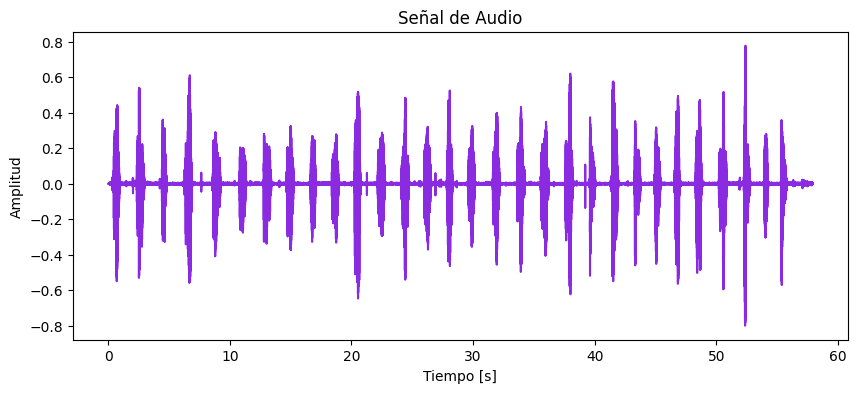

In [ ]:
import soundfile as sf  # Librería para leer archivos de audio

# Cargar el archivo de audio descargado
file_path = "noclave.wav"  # Ruta del archivo
audio_data, sample_rate = sf.read(file_path)

# Mostrar información básica del audio
print(f"Frecuencia de muestreo: {sample_rate} Hz")
print(f"Número de muestras: {len(audio_data)}")
print(f"Forma del audio: {audio_data.shape}")

# Si el audio tiene dos canales, convertirlo a mono
if len(audio_data.shape) == 2:
    audio_data = audio_data.mean(axis=1)  # Promediar los canales estéreo para obtener mono
    print("Audio convertido a mono.")

# Verificar duración del audio en segundos
duracion = len(audio_data) / sample_rate
print(f"Duración del audio: {duracion:.2f} segundos")

# Graficar la señal de audio
import matplotlib.pyplot as plt
import numpy as np

t = np.linspace(0, duracion, len(audio_data))  # Vector de tiempo
plt.figure(figsize=(10, 4))
plt.plot(t, audio_data, color="blueviolet")
plt.title("Señal de Audio")
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud")
plt.show()

**Vamos a reproducir uno de los fragmentos de las palabras no clave**

In [ ]:
input_audio = "noclave.wav"
output_directory = "segmented_audiosError"
segment=segment_audio_by_energy(input_audio, output_directory)

#vamos a escuchar el fragmento 24 de las palabras no clave
ipd.Audio("segmented_audiosError/segment_24.wav")

Segmento 1 guardado: segmented_audiosError/segment_1.wav
Segmento 2 guardado: segmented_audiosError/segment_2.wav
Segmento 3 guardado: segmented_audiosError/segment_3.wav
Segmento 4 guardado: segmented_audiosError/segment_4.wav
Segmento 5 guardado: segmented_audiosError/segment_5.wav
Segmento 6 guardado: segmented_audiosError/segment_6.wav
Segmento 7 guardado: segmented_audiosError/segment_7.wav
Segmento 8 guardado: segmented_audiosError/segment_8.wav
Segmento 9 guardado: segmented_audiosError/segment_9.wav
Segmento 10 guardado: segmented_audiosError/segment_10.wav
Segmento 11 guardado: segmented_audiosError/segment_11.wav
Segmento 12 guardado: segmented_audiosError/segment_12.wav
Segmento 13 guardado: segmented_audiosError/segment_13.wav
Segmento 14 guardado: segmented_audiosError/segment_14.wav
Segmento 15 guardado: segmented_audiosError/segment_15.wav
Segmento 16 guardado: segmented_audiosError/segment_16.wav
Segmento 17 guardado: segmented_audiosError/segment_17.wav
Segmento 18 gua

##**Vamos a construir la base de datos de las palabras no clave y la palabra clave**

In [ ]:
import os
import numpy as np
import librosa
import scipy.fftpack as fft
import pickle
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Función para calcular el espectro de Fourier
def compute_spectrum(signal, sr, n_fft=2064):
    spectrum = np.abs(fft.fft(signal, n=n_fft))  # Magnitud del espectro
    max_val = np.max(spectrum)
    if max_val > 0:
     spectrum = spectrum / max_val  # Normalizar evitando división por cero
    else:
     spectrum = np.zeros_like(spectrum)  # Si es 0, evitar división errónea
    return spectrum[:n_fft // 2]      # Usamos solo la mitad (simetría de la FFT)
    #spectrum = spectrum / np.min(spectrum)  # Normalizar por el valor minimo
    #return spectrum[:n_fft // 2]  # Usamos solo la mitad (simetría de la FFT)

# Función para procesar una carpeta de audios y crear la base de datos
def create_database(folder_path, sr=22050):
    database = []
    filenames = []
    for filename in os.listdir(folder_path):
        if filename.endswith(".wav"):  # Solo procesar archivos .wav
            file_path = os.path.join(folder_path, filename)
            signal, _ = librosa.load(file_path, sr=sr)  # Cargar el audio
            spectrum = compute_spectrum(signal, sr)  # Calcular el espectro
            database.append(spectrum)  # Agregar a la base de datos
            filenames.append(filename)  # Guardar el nombre del archivo
    return np.array(database), filenames

# Rutas de las carpetas en Colab
correct_folder = "/content/segmented_audios"  # Carpeta con la palabra correcta
error_folder = "/content/segmented_audiosError"  # Carpeta con palabras incorrectas

# Crear las bases de datos
correct_database, correct_filenames = create_database(correct_folder)  # Base de datos para la palabra correcta
error_database, error_filenames = create_database(error_folder)  # Base de datos para palabras incorrectas

# Combinar las bases de datos y crear etiquetas
X = np.vstack((correct_database, error_database))  # Combinar espectros
labels = np.array([1] * len(correct_database) + [0] * len(error_database))  # Etiquetas (1: correcta, 0: incorrecta)
filenames = correct_filenames + error_filenames  # Nombres de los archivos

**Realizamos conversión a 2D**

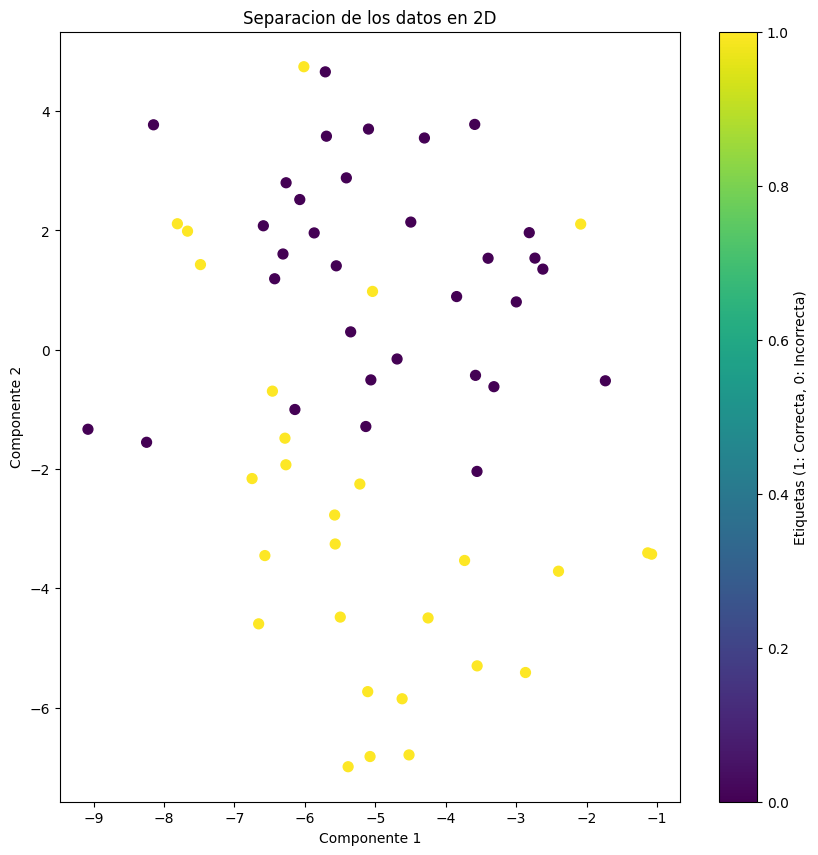

In [ ]:
# Reducción a 2D usando t-SNE o PCA
fmax = 7000  # Considerar solo frecuencias hasta fmax Hz
red_ = TSNE(perplexity=20, n_components=2, random_state=123, learning_rate='auto', init='pca')
# red_ = PCA(n_components=2, random_state=123)  # Alternativa: PCA
X_2D = red_.fit_transform(X[:, :fmax])  # Reducir a 2D

# Graficar separabilidad 2D
plt.figure(figsize=(10, 10))
plt.scatter(X_2D[:, 0], X_2D[:, 1], c=labels, cmap='viridis', s=50)
plt.colorbar(label="Etiquetas (1: Correcta, 0: Incorrecta)")
plt.title("Separacion de los datos en 2D")
plt.xlabel("Componente 1")
plt.ylabel("Componente 2")
plt.show()


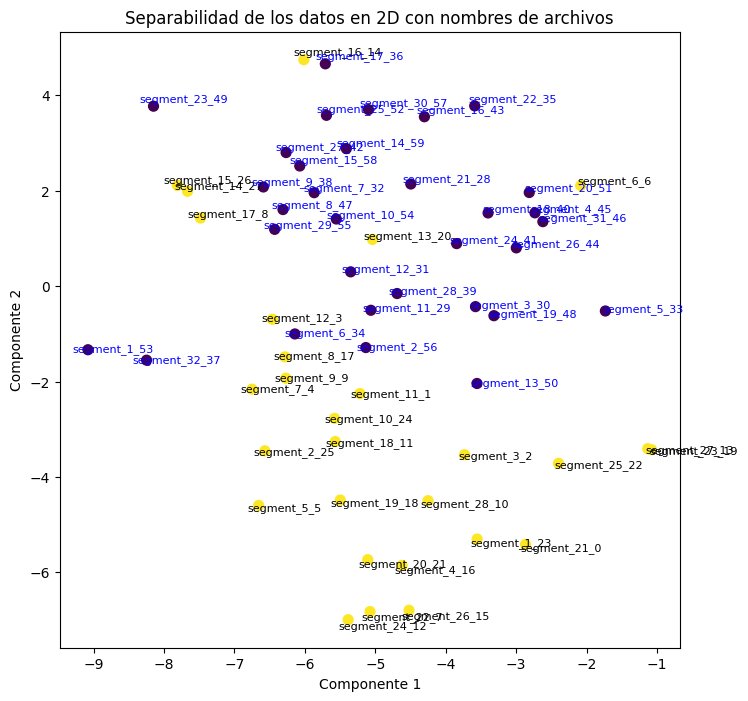

Bases de datos creadas y guardadas correctamente.
Tamaño de la base de datos palabra clave correcta: 28
Tamaño de la base de datos de palabra no clave: 32


In [ ]:
# Graficar con nombres de archivos
plt.figure(figsize=(8, 8))
colors = ["blue", "black"]  # Colores para las etiquetas
plt.scatter(X_2D[:, 0], X_2D[:, 1], c=labels, cmap='viridis', s=50)
for i, tex in enumerate(filenames):
    plt.text(X_2D[i, 0] * 1.025, X_2D[i, 1] * 1.025, tex[:-4] + f"_{i}", fontsize=8, color=colors[labels[i]])
plt.title("Separabilidad de los datos en 2D con nombres de archivos")
plt.xlabel("Componente 1")
plt.ylabel("Componente 2")
plt.show()

# Guardar las bases de datos en archivos
with open("correct_database.pkl", "wb") as f:
    pickle.dump(correct_database, f)

with open("error_database.pkl", "wb") as f:
    pickle.dump(error_database, f)

print("Bases de datos creadas y guardadas correctamente.")
print(f"Tamaño de la base de datos palabra clave correcta: {len(correct_database)}")
print(f"Tamaño de la base de datos de palabra no clave: {len(error_database)}")

**Cargamos un archivo para comparar si es la palabra clave o no**

In [ ]:
!pip install pydub

In [ ]:
import pickle
from pydub import AudioSegment
from scipy.spatial.distance import euclidean
from google.colab import files

# Función para convertir un archivo de audio a WAV
def convert_to_wav(input_file, output_file):
    audio = AudioSegment.from_file(input_file)
    audio.export(output_file, format="wav")
    print(f"Archivo convertido a WAV: {output_file}")

# Función para calcular el espectro de Fourier
def compute_spectrum(signal, sr, n_fft=1024):
    spectrum = np.abs(fft.fft(signal, n=n_fft))  # Magnitud del espectro
    spectrum = spectrum[:n_fft // 2]  # Usamos solo la mitad (simetría de la FFT)
    spectrum = spectrum / np.max(spectrum)  # Normalizar el espectro
    return spectrum

# Función para calcular el índice del valor mínimo en el espectro
def compute_min_spectrum_index(signal, sr, n_fft=1024):
    spectrum = compute_spectrum(signal, sr, n_fft)
    min_index = np.argmin(spectrum)  # Índice del valor mínimo en el espectro
    return min_index

# Función para cortar el audio basado en la energía (igual que en tu código)
def segment_audio_by_energy(y, sr, frame_length=1024, hop_length=256, padding=0.05, merge_gap=0.3):
    # Calcular la energía de la señal
    energy = np.array([
        np.sum(np.square(y[i : i + frame_length]))
        for i in range(0, len(y), hop_length)
    ])

    # Normalizar la energía
    energy = energy / np.max(energy)

    # Establecer un umbral dinámico basado en el percentil 55
    energy_threshold = np.percentile(energy, 55)

    # Encontrar regiones con energía mayor al umbral
    voiced_frames = energy > energy_threshold

    # Determinar los índices de los segmentos hablados
    change_points = np.diff(voiced_frames.astype(int))
    start_indices = np.where(change_points == 1)[0] * hop_length
    end_indices = np.where(change_points == -1)[0] * hop_length

    if len(end_indices) == 0 or (len(start_indices) > 0 and start_indices[0] > end_indices[0]):
        end_indices = np.append(end_indices, len(y))
    if len(start_indices) == 0 or (len(end_indices) > 0 and end_indices[-1] < start_indices[-1]):
        start_indices = np.insert(start_indices, 0, 0)

    # Filtrar segmentos pequeños (ruido)
    min_duration = 0.1 * sr  # Reducimos a 100 ms para evitar cortes de palabras
    valid_segments = [(start, end) for start, end in zip(start_indices, end_indices) if end - start > min_duration]

    # Unir segmentos muy cercanos (para evitar cortes en sílabas)
    merged_segments = []
    prev_start, prev_end = valid_segments[0]
    for start, end in valid_segments[1:]:
        if start - prev_end < merge_gap * sr:  # Si la pausa es menor que 300 ms, unir segmentos
            prev_end = end
        else:
            merged_segments.append((prev_start, prev_end))
            prev_start, prev_end = start, end
    merged_segments.append((prev_start, prev_end))  # Agregar el último segmento

    # Aplicar padding antes y después de cada segmento
    padding_samples = int(padding * sr)
    merged_segments = [(max(0, start - padding_samples), min(len(y), end + padding_samples)) for start, end in merged_segments]

    return merged_segments

# Función para comparar un índice mínimo con una base de datos usando distancia euclidiana
def compare_with_database(input_min_index, database):
    min_distance = float('inf')
    for db_spectrum in database:  # Iterate over spectra in the database
        db_min_index = np.argmin(db_spectrum)  # Get the index of the minimum value in the spectrum
        distance = euclidean([input_min_index], [db_min_index])  # Calculate distance using the minimum indices
        if distance < min_distance:
            min_distance = distance
    return min_distance

# Subir un archivo de audio

uploaded = files.upload()
uploaded_file = list(uploaded.keys())[0]

# Convertir a WAV si no está en formato WAV
if not uploaded_file.endswith(".wav"):
    output_file = "converted_audio.wav"
    convert_to_wav(uploaded_file, output_file)
    audio_file = output_file
else:
    audio_file = uploaded_file

# Cargar el archivo de audio
signal, sr = librosa.load(audio_file, sr=16000, mono=True)  # Convertimos a 16 kHz y mono

# Cortar el audio basado en la energía (usando la misma lógica que en la base de datos)
segments = segment_audio_by_energy(signal, sr)

# Si hay segmentos, tomar el primero (asumimos que es el más relevante)
if len(segments) > 0:
    start, end = segments[0]
    trimmed_signal = signal[start:end]
else:
    trimmed_signal = signal  # Si no se encuentra ningún segmento, usar la señal completa

# Calcular el índice del valor mínimo en el espectro del audio subido
input_min_index = compute_min_spectrum_index(trimmed_signal, sr)

# Cargar las bases de datos
with open("correct_database.pkl", "rb") as f:
    correct_database = pickle.load(f)

with open("error_database.pkl", "rb") as f:
    error_database = pickle.load(f)

# Comparar con la base de datos de palabras correctas
distance_correct = compare_with_database(input_min_index, correct_database)

# Comparar con la base de datos de palabras incorrectas
distance_error = compare_with_database(input_min_index, error_database)

# Tomar una decisión
if distance_correct < distance_error:
    print("Acceso permitido, el audio ingresado pertenece a la palabra clave.")
else:
    print("Acceso denegado, el audio ingresado no pertenece a la palabra clave.")

Saving Palabra-Clave.wav to Palabra-Clave.wav
Acceso permitido, el audio ingresado pertenece a la palabra clave.
